# Group Members & Contributions:










Manan Sidhu- SIDMY014

Contributed to Task 1, Task2, Task 3, Task 4, Task 5.

Anthony John Cava - CAVAY010

Contributed to Task 1, Task2, Task 3, Task 4, Task 5.

Chehak - NAYCN001

Contributed to Task 1, Task2, Task 3, Task 4, Task 5.



# Task 1. Review and Prepare the Dataset

## Task 1a) Understand the Data

**Airline passenger customer satisfaction dataset**

**Data Set Characteristics:**

Number of instances: 129,487

Number of attributes: 25 numeric/categorical predictive. Satisfaction (attribute 26) is the target.

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn import metrics
%matplotlib inline
from google.colab import drive
drive.mount("/content/drive", force_remount=True)
import sys
sys.path.append("/content/drive/MyDrive/Colab Notebooks")

Mounted at /content/drive


In [ ]:
trainData = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/train.csv')

In [ ]:
testData = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/test.csv')

Combining both Training and Testing dataset in order to analyse the entire dataset:

In [ ]:
totalData = pd.concat([trainData,testData])

In [ ]:
totalData.isnull().sum()

Gender                               0
Customer Type                        0
Age                                  0
Type of Travel                       0
Class                                0
Flight Distance                      0
Inflight wifi service                0
Departure/Arrival time convenient    0
Ease of Online booking               0
Gate location                        0
Food and drink                       0
Online boarding                      0
Seat comfort                         0
Inflight entertainment               0
On-board service                     0
Leg room service                     0
Baggage handling                     0
Checkin service                      0
Inflight service                     0
Cleanliness                          0
Departure Delay in Minutes           0
Arrival Delay in Minutes             0
Order                                0
Comfort                              0
Service                              0
satisfaction             

Result: There are no missing values in the dataset.

Understanding the shape and nature of the data.

In [ ]:
print("Train Data:", trainData.shape)
print("Test Data:", testData.shape)
print("Total Data:", totalData.shape)

Train Data: (103594, 26)
Test Data: (25893, 26)
Total Data: (129487, 26)


In [ ]:
print("Total data label distribution")
print(totalData['satisfaction'].value_counts())
print("\nTrain data label distribution")
print(trainData['satisfaction'].value_counts())
print("\nTest data label distribution")
print(testData['satisfaction'].value_counts())

Total data label distribution
0    73225
1    56262
Name: satisfaction, dtype: int64

Train data label distribution
0    58697
1    44897
Name: satisfaction, dtype: int64

Test data label distribution
0    14528
1    11365
Name: satisfaction, dtype: int64


* The entire data set consisits of 129,487 customer satisfaction survey results, all comprising of 25 features to predict the 26th feature (Satisfaction) on wether the customer is ultimately 'satisfied' or 'neutral or dissatisfied'. 73,225 (56.11%) of the data set consists of 'neutral or dissatisfied' results, and 56,262 (43.45%) consists of 'satisfied' results.

* The training data set (80% of the entire data set) consists of 103,594 samples, with 58,697 (56.66%) having a 'neutral or dissatisfied' result and 44,897 (43.34%) having a 'satisfied' result.

* The testing data set (20% of the entire data set) consists of 25,893 samples, with 14,528 (56.11%) having a 'neutral or dissatisfied' result and 11,365 (43.89%) having a 'satisfied' result.


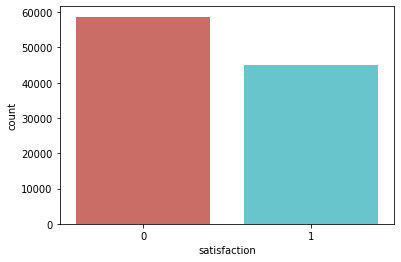

In [ ]:
sns.countplot(x='satisfaction', data=trainData, palette='hls')
plt.show()

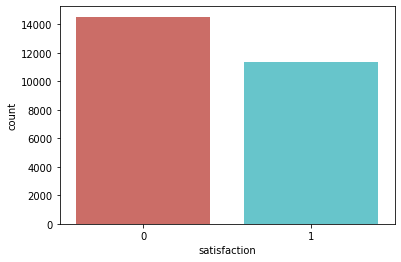

In [ ]:
sns.countplot(x='satisfaction', data=testData, palette='hls')
plt.show()

This shows that the labels aren't distributed evenly. There are more dissatisfied passengers over satisfied passengers in both train and test sets. This means the Accuracy wouldn't be a goot metric to use due to the 'Accuracy Paradox'.

In [ ]:
trainData.groupby(trainData['Customer Type'])['satisfaction'].mean()

Customer Type
0    0.236848
1    0.477345
Name: satisfaction, dtype: float64

In [ ]:
trainData.groupby(trainData['Type of Travel'])['satisfaction'].mean()

Type of Travel
0    0.101559
1    0.582579
Name: satisfaction, dtype: float64

In [ ]:
trainData.groupby(trainData['Class'])['satisfaction'].mean()

Class
0    0.186101
1    0.245849
2    0.694285
Name: satisfaction, dtype: float64

In [ ]:
testData.groupby(testData['Customer Type'])['satisfaction'].mean()
testData.groupby(testData['Type of Travel'])['satisfaction'].mean()
testData.groupby(testData['Class'])['satisfaction'].mean()

Class
0    0.193596
1    0.247908
2    0.695191
Name: satisfaction, dtype: float64

The following have been considered by running the code above and taking account of mean of the satisfaction value
For Train & Test Dataset:
*   Loyal Customers have more satisfaction rate 
*   Customers on Business trips were more satisfied than people on personal travel trips 
*   Passengers in Business class were most satisfied



### Exploring each feature to determine key features

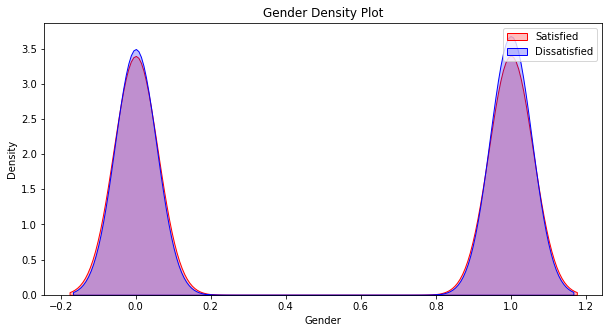

In [ ]:
feature = trainData.columns[0]
plt.figure(figsize=(10,5))
ax = sns.kdeplot(trainData[feature][trainData.satisfaction == 1], color="red", shade=True)
sns.kdeplot(trainData[feature][trainData.satisfaction == 0], color="blue", shade=True)
plt.legend(['Satisfied', 'Dissatisfied'])
plt.title(feature + " Density Plot")
ax.set(xlabel=feature)
#plt.xlim(-3,3)
plt.show()

Gender isn't a key feature. The gender distribution of passengers who are satisfied/dissatisfied are very similar.

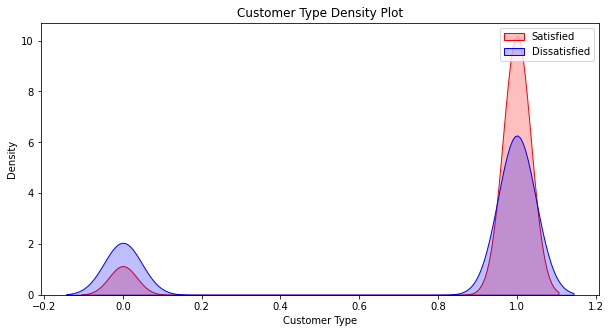

In [ ]:
feature = trainData.columns[1]
plt.figure(figsize=(10,5))
ax = sns.kdeplot(trainData[feature][trainData.satisfaction == 1], color="red", shade=True)
sns.kdeplot(trainData[feature][trainData.satisfaction == 0], color="blue", shade=True)
plt.legend(['Satisfied', 'Dissatisfied'])
plt.title(feature + " Density Plot")
ax.set(xlabel=feature)
#plt.xlim(-3,3)
plt.show()

The Customer Type is a key feature. The graph shows that majority of Loyal customers (1) are satisfied, whereas majority of Disloyal customers (0) are dissatisfied.

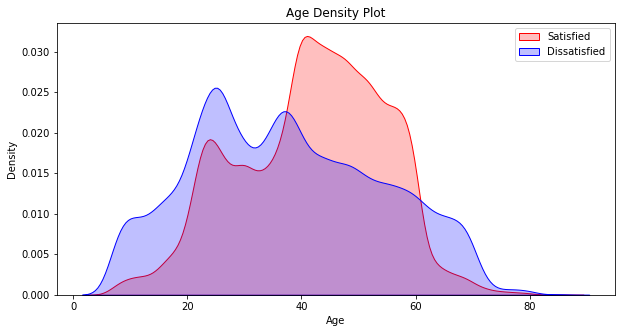

In [ ]:
feature = trainData.columns[2]
plt.figure(figsize=(10,5))
ax = sns.kdeplot(trainData[feature][trainData.satisfaction == 1], color="red", shade=True)
sns.kdeplot(trainData[feature][trainData.satisfaction == 0], color="blue", shade=True)
plt.legend(['Satisfied', 'Dissatisfied'])
plt.title(feature + " Density Plot")
ax.set(xlabel=feature)
#plt.xlim(-3,3)
plt.show()

The Age is a key feature. The graph shows that majority of passengers age 40-60 are satisfied, whereas those around 25 and below tends to be more dissatisfied as well as those 60 and above.

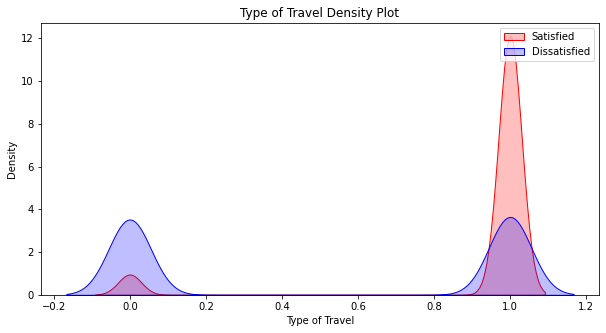

In [ ]:
feature = trainData.columns[3]
plt.figure(figsize=(10,5))
ax = sns.kdeplot(trainData[feature][trainData.satisfaction == 1], color="red", shade=True)
sns.kdeplot(trainData[feature][trainData.satisfaction == 0], color="blue", shade=True)
plt.legend(['Satisfied', 'Dissatisfied'])
plt.title(feature + " Density Plot")
ax.set(xlabel=feature)
#plt.xlim(-3,3)
plt.show()

Type of Travel is a key feature. Similar to the Customer Type, those traveling for Business (1) are remarkably more satisfied compared to those whose purpose is Personal travel (0), who are remarkably dissatisfied.

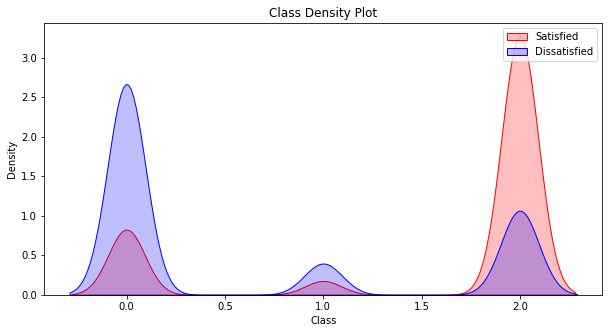

In [ ]:
feature = trainData.columns[4]
plt.figure(figsize=(10,5))
ax = sns.kdeplot(trainData[feature][trainData.satisfaction == 1], color="red", shade=True)
sns.kdeplot(trainData[feature][trainData.satisfaction == 0], color="blue", shade=True)
plt.legend(['Satisfied', 'Dissatisfied'])
plt.title(feature + " Density Plot")
ax.set(xlabel=feature)
#plt.xlim(-3,3)
plt.show()

Class is a key feature. Similar to the Type of Travel, those traveling in Business class (2) are very satisfied, whereas those in Eco (0) and Eco+ (1) class are very dissatisfied.

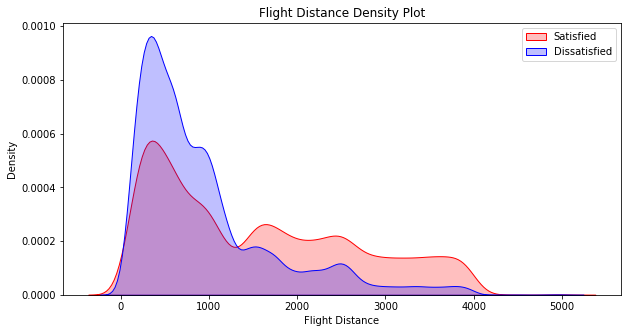

In [ ]:
feature = trainData.columns[5]
plt.figure(figsize=(10,5))
ax = sns.kdeplot(trainData[feature][trainData.satisfaction == 1], color="red", shade=True)
sns.kdeplot(trainData[feature][trainData.satisfaction == 0], color="blue", shade=True)
plt.legend(['Satisfied', 'Dissatisfied'])
plt.title(feature + " Density Plot")
ax.set(xlabel=feature)
#plt.xlim(-3,3)
plt.show()

Flight distance is a key feature. Those traveling less than 1000 miles are mostly dissatsified, whereas the further teh flight distance is, the more satisfied the passengers tends to be.

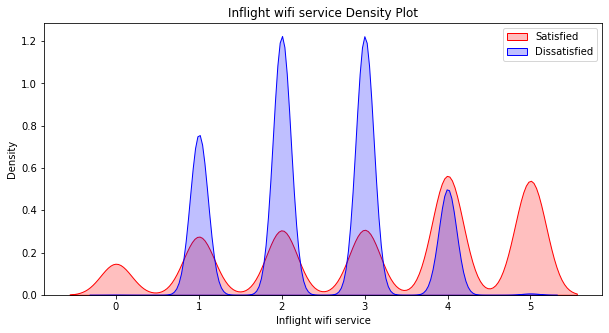

In [ ]:
feature = trainData.columns[6]
plt.figure(figsize=(10,5))
ax = sns.kdeplot(trainData[feature][trainData.satisfaction == 1], color="red", shade=True)
sns.kdeplot(trainData[feature][trainData.satisfaction == 0], color="blue", shade=True)
plt.legend(['Satisfied', 'Dissatisfied'])
plt.title(feature + " Density Plot")
ax.set(xlabel=feature)
#plt.xlim(-3,3)
plt.show()

Inflight wifi service is a key feature. Those who rated the wifi service as 1-3 tends to be more dissatisfied and those who rated it as 5 seems to be highly satisfied. Surprising to see that those who rated it as 0 are still satisfied.

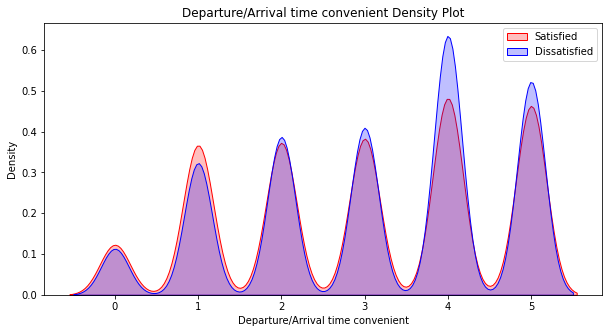

In [ ]:
feature = trainData.columns[7]
plt.figure(figsize=(10,5))
ax = sns.kdeplot(trainData[feature][trainData.satisfaction == 1], color="red", shade=True)
sns.kdeplot(trainData[feature][trainData.satisfaction == 0], color="blue", shade=True)
plt.legend(['Satisfied', 'Dissatisfied'])
plt.title(feature + " Density Plot")
ax.set(xlabel=feature)
#plt.xlim(-3,3)
plt.show()

The Departure/Arrival time convenient is not a key feature. Regardless of the rating, the satisfied/dissatisfied distribution are very similar.

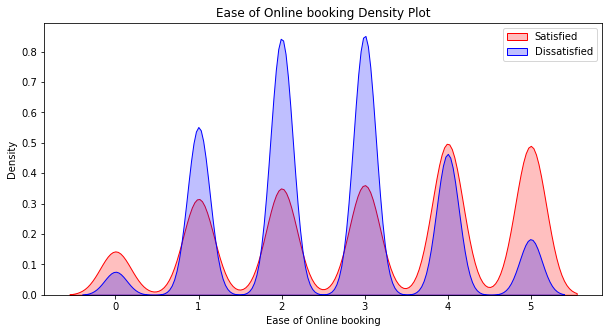

In [ ]:
feature = trainData.columns[8]
plt.figure(figsize=(10,5))
ax = sns.kdeplot(trainData[feature][trainData.satisfaction == 1], color="red", shade=True)
sns.kdeplot(trainData[feature][trainData.satisfaction == 0], color="blue", shade=True)
plt.legend(['Satisfied', 'Dissatisfied'])
plt.title(feature + " Density Plot")
ax.set(xlabel=feature)
#plt.xlim(-3,3)
plt.show()

The Ease of Online booking is a key feature. It shows that those who rated it 1-3 are more dissatisfied. It's very similar to the Inflight Wifi Service graph. We will check the correlation between the two later.

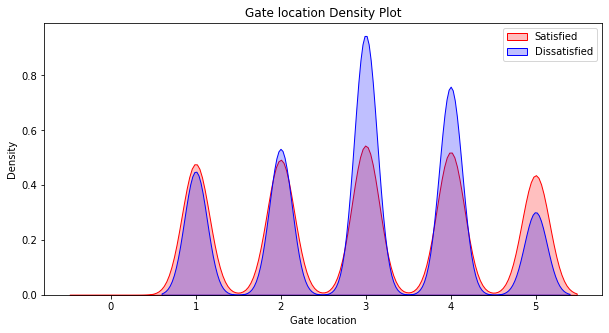

In [ ]:
feature = trainData.columns[9]
plt.figure(figsize=(10,5))
ax = sns.kdeplot(trainData[feature][trainData.satisfaction == 1], color="red", shade=True)
sns.kdeplot(trainData[feature][trainData.satisfaction == 0], color="blue", shade=True)
plt.legend(['Satisfied', 'Dissatisfied'])
plt.title(feature + " Density Plot")
ax.set(xlabel=feature)
#plt.xlim(-3,3)
plt.show()

The Gate location is not a key feature. The distributions are very similar across most ratings.

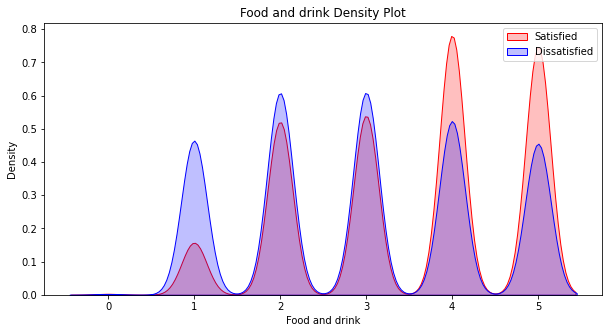

In [ ]:
feature = trainData.columns[10]
plt.figure(figsize=(10,5))
ax = sns.kdeplot(trainData[feature][trainData.satisfaction == 1], color="red", shade=True)
sns.kdeplot(trainData[feature][trainData.satisfaction == 0], color="blue", shade=True)
plt.legend(['Satisfied', 'Dissatisfied'])
plt.title(feature + " Density Plot")
ax.set(xlabel=feature)
#plt.xlim(-3,3)
plt.show()

The Food and drink is a key feature. Those who rated it 4-5 are mostly satisfied, while those who rated it 1 are highly dissatisfied.

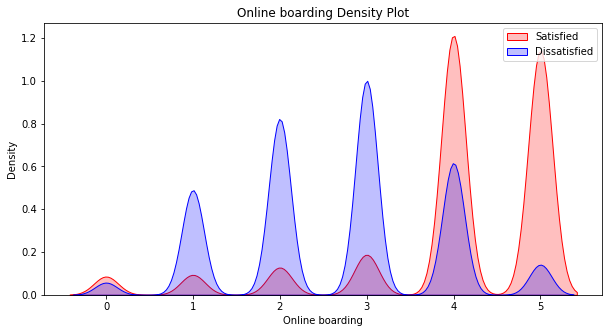

In [ ]:
feature = trainData.columns[11]
plt.figure(figsize=(10,5))
ax = sns.kdeplot(trainData[feature][trainData.satisfaction == 1], color="red", shade=True)
sns.kdeplot(trainData[feature][trainData.satisfaction == 0], color="blue", shade=True)
plt.legend(['Satisfied', 'Dissatisfied'])
plt.title(feature + " Density Plot")
ax.set(xlabel=feature)
#plt.xlim(-3,3)
plt.show()

Online boarding is a key feature. Those who rated it 4-5 are mostly satisfied, while those who rated it 1-3 are mostly dissatisfied. Interesting to see that some who rated it as 0 could still be satisfied.

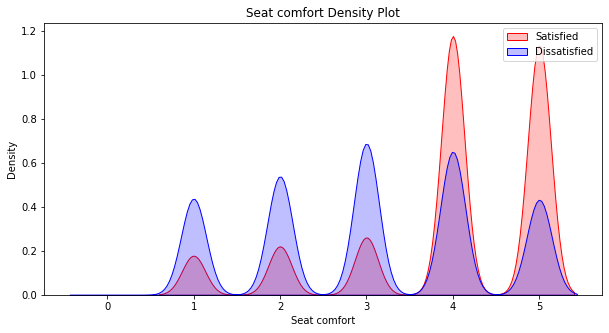

In [ ]:
feature = trainData.columns[12]
plt.figure(figsize=(10,5))
ax = sns.kdeplot(trainData[feature][trainData.satisfaction == 1], color="red", shade=True)
sns.kdeplot(trainData[feature][trainData.satisfaction == 0], color="blue", shade=True)
plt.legend(['Satisfied', 'Dissatisfied'])
plt.title(feature + " Density Plot")
ax.set(xlabel=feature)
#plt.xlim(-3,3)
plt.show()

Seat comfort is a key feature. It obviously shows that most who rated it 4-5 are satisfied, while those who rated it 3 below are mostly dissatisfied.

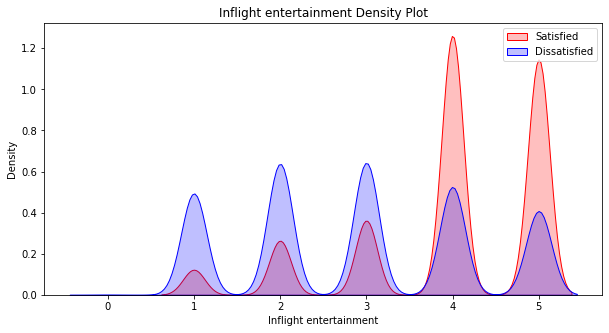

In [ ]:
feature = trainData.columns[13]
plt.figure(figsize=(10,5))
ax = sns.kdeplot(trainData[feature][trainData.satisfaction == 1], color="red", shade=True)
sns.kdeplot(trainData[feature][trainData.satisfaction == 0], color="blue", shade=True)
plt.legend(['Satisfied', 'Dissatisfied'])
plt.title(feature + " Density Plot")
ax.set(xlabel=feature)
#plt.xlim(-3,3)
plt.show()

Inflight entertainment is a key feature. Similar to seat comfort, most who rated it 4-5 are satisfied, while those who rated it 3 below are mostly dissatisfied.

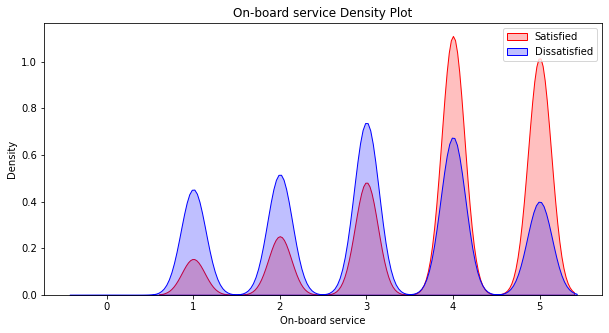

In [ ]:
feature = trainData.columns[14]
plt.figure(figsize=(10,5))
ax = sns.kdeplot(trainData[feature][trainData.satisfaction == 1], color="red", shade=True)
sns.kdeplot(trainData[feature][trainData.satisfaction == 0], color="blue", shade=True)
plt.legend(['Satisfied', 'Dissatisfied'])
plt.title(feature + " Density Plot")
ax.set(xlabel=feature)
#plt.xlim(-3,3)
plt.show()

On-board service is a key feature. Those who rated it as 4-5 are mostly satisfied, while those who rated it 3 below are mostly dissatisfied.

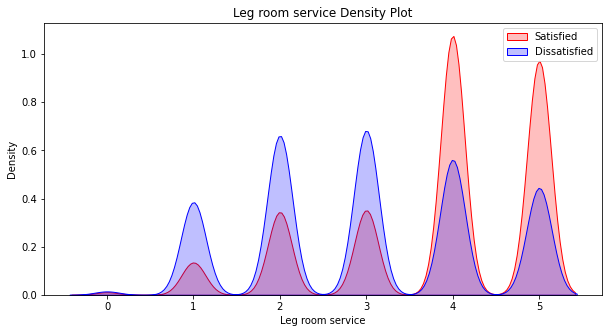

In [ ]:
feature = trainData.columns[15]
plt.figure(figsize=(10,5))
ax = sns.kdeplot(trainData[feature][trainData.satisfaction == 1], color="red", shade=True)
sns.kdeplot(trainData[feature][trainData.satisfaction == 0], color="blue", shade=True)
plt.legend(['Satisfied', 'Dissatisfied'])
plt.title(feature + " Density Plot")
ax.set(xlabel=feature)
#plt.xlim(-3,3)
plt.show()

Leg room service is a key feature.  Those who rated it as 4-5 are mostly satisfied, while those who rated it 3 below are mostly dissatisfied.

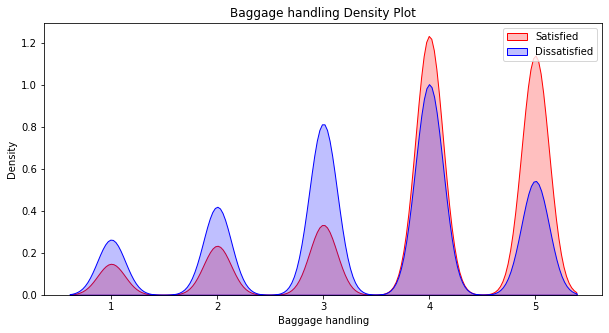

In [ ]:
feature = trainData.columns[16]
plt.figure(figsize=(10,5))
ax = sns.kdeplot(trainData[feature][trainData.satisfaction == 1], color="red", shade=True)
sns.kdeplot(trainData[feature][trainData.satisfaction == 0], color="blue", shade=True)
plt.legend(['Satisfied', 'Dissatisfied'])
plt.title(feature + " Density Plot")
ax.set(xlabel=feature)
#plt.xlim(-3,3)
plt.show()

Bagagge handling is a key feature. Those who rated it as 4-5 are mostly satisfied, while those who rated it 3 below are mostly dissatisfied.

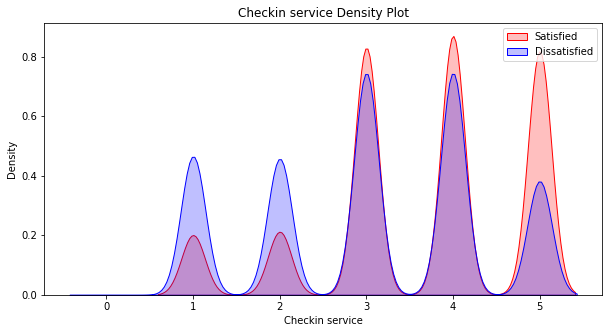

In [ ]:
feature = trainData.columns[17]
plt.figure(figsize=(10,5))
ax = sns.kdeplot(trainData[feature][trainData.satisfaction == 1], color="red", shade=True)
sns.kdeplot(trainData[feature][trainData.satisfaction == 0], color="blue", shade=True)
plt.legend(['Satisfied', 'Dissatisfied'])
plt.title(feature + " Density Plot")
ax.set(xlabel=feature)
#plt.xlim(-3,3)
plt.show()

Checkin service is a key feature. Those who rated it as 5 are mostly satisfied, while those who rated it below 3 are mostly dissatisfied.

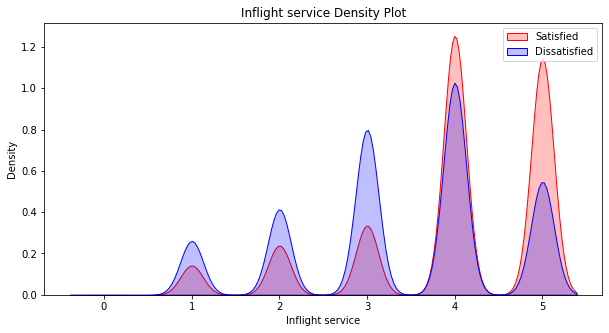

In [ ]:
feature = trainData.columns[18]
plt.figure(figsize=(10,5))
ax = sns.kdeplot(trainData[feature][trainData.satisfaction == 1], color="red", shade=True)
sns.kdeplot(trainData[feature][trainData.satisfaction == 0], color="blue", shade=True)
plt.legend(['Satisfied', 'Dissatisfied'])
plt.title(feature + " Density Plot")
ax.set(xlabel=feature)
#plt.xlim(-3,3)
plt.show()

Inlfight service is a key feature.  Those who rated it as 4-5 are mostly satisfied, while those who rated it 3 below are mostly dissatisfied.

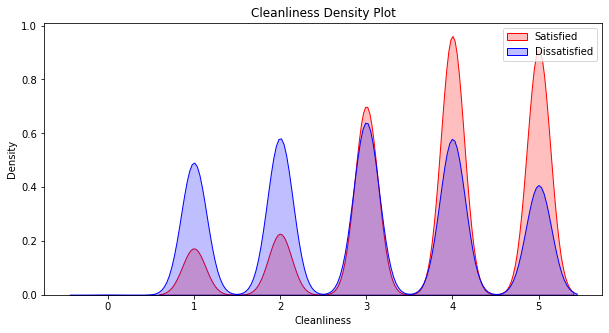

In [ ]:
feature = trainData.columns[19]
plt.figure(figsize=(10,5))
ax = sns.kdeplot(trainData[feature][trainData.satisfaction == 1], color="red", shade=True)
sns.kdeplot(trainData[feature][trainData.satisfaction == 0], color="blue", shade=True)
plt.legend(['Satisfied', 'Dissatisfied'])
plt.title(feature + " Density Plot")
ax.set(xlabel=feature)
#plt.xlim(-3,3)
plt.show()

Cleanliness is a key feature. Those who rated it 4-5 are mostly satisfied.

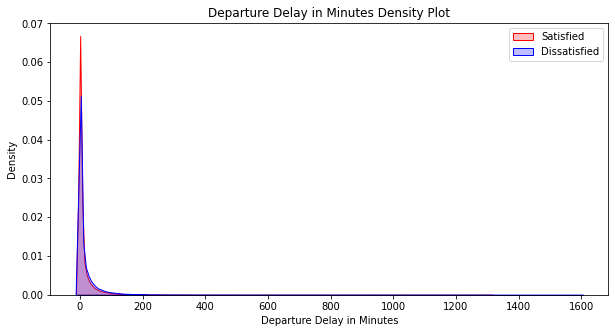

In [ ]:
feature = trainData.columns[20]
plt.figure(figsize=(10,5))
ax = sns.kdeplot(trainData[feature][trainData.satisfaction == 1], color="red", shade=True)
sns.kdeplot(trainData[feature][trainData.satisfaction == 0], color="blue", shade=True)
plt.legend(['Satisfied', 'Dissatisfied'])
plt.title(feature + " Density Plot")
ax.set(xlabel=feature)
#plt.xlim(-3,3)
plt.show()

Departure Delay in Minutes is not a key feature. Majority of the distribution is highly similar.

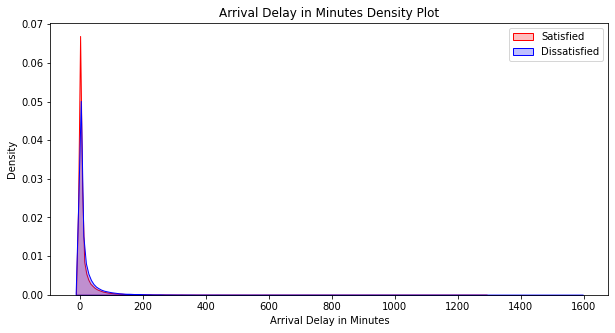

In [ ]:
feature = trainData.columns[21]
plt.figure(figsize=(10,5))
ax = sns.kdeplot(trainData[feature][trainData.satisfaction == 1], color="red", shade=True)
sns.kdeplot(trainData[feature][trainData.satisfaction == 0], color="blue", shade=True)
plt.legend(['Satisfied', 'Dissatisfied'])
plt.title(feature + " Density Plot")
ax.set(xlabel=feature)
#plt.xlim(-3,3)
plt.show()

Arrival Delay in Minutes is not a key feature. Majority of the distribution is highly similar.

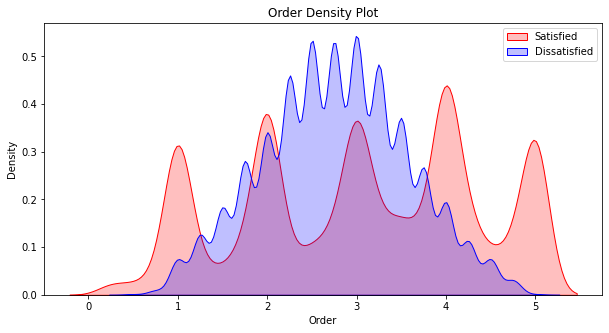

In [ ]:
feature = trainData.columns[22]
plt.figure(figsize=(10,5))
ax = sns.kdeplot(trainData[feature][trainData.satisfaction == 1], color="red", shade=True)
sns.kdeplot(trainData[feature][trainData.satisfaction == 0], color="blue", shade=True)
plt.legend(['Satisfied', 'Dissatisfied'])
plt.title(feature + " Density Plot")
ax.set(xlabel=feature)
#plt.xlim(-3,3)
plt.show()

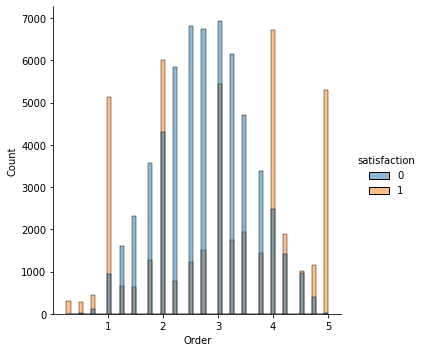

In [ ]:
sns.displot(data=trainData, x=feature, hue='satisfaction');

Order is a key feature.

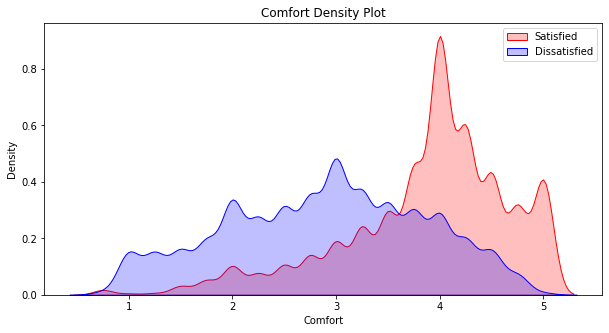

In [ ]:
feature = trainData.columns[23]
plt.figure(figsize=(10,5))
ax = sns.kdeplot(trainData[feature][trainData.satisfaction == 1], color="red", shade=True)
sns.kdeplot(trainData[feature][trainData.satisfaction == 0], color="blue", shade=True)
plt.legend(['Satisfied', 'Dissatisfied'])
plt.title(feature + " Density Plot")
ax.set(xlabel=feature)
#plt.xlim(-3,3)
plt.show()

Comfort is a key feature. Those who rated it 4-5 are clearly more satisfied.

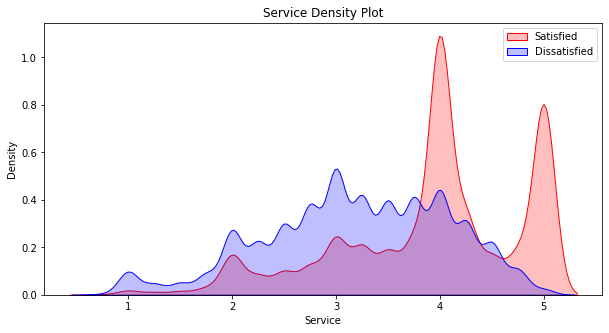

In [ ]:
feature = trainData.columns[24]
plt.figure(figsize=(10,5))
ax = sns.kdeplot(trainData[feature][trainData.satisfaction == 1], color="red", shade=True)
sns.kdeplot(trainData[feature][trainData.satisfaction == 0], color="blue", shade=True)
plt.legend(['Satisfied', 'Dissatisfied'])
plt.title(feature + " Density Plot")
ax.set(xlabel=feature)
#plt.xlim(-3,3)
plt.show()

Service is a key feature. Those who rated it as 4-5 are clearly more satisfied.

**Initial Key Features selected:**

In [ ]:
initial_selected_features = ['Customer Type', 'Age', 'Type of Travel', 'Class',
       'Flight Distance', 'Inflight wifi service',
       'Ease of Online booking',
      'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'Cleanliness',
       'Order', 'Comfort', 'Service']

**Checking correlations between each features and removing highly correlated features.**

Correlation matrix - to determine which features in the dataset correlate with each other. (visualised as a heatmap)

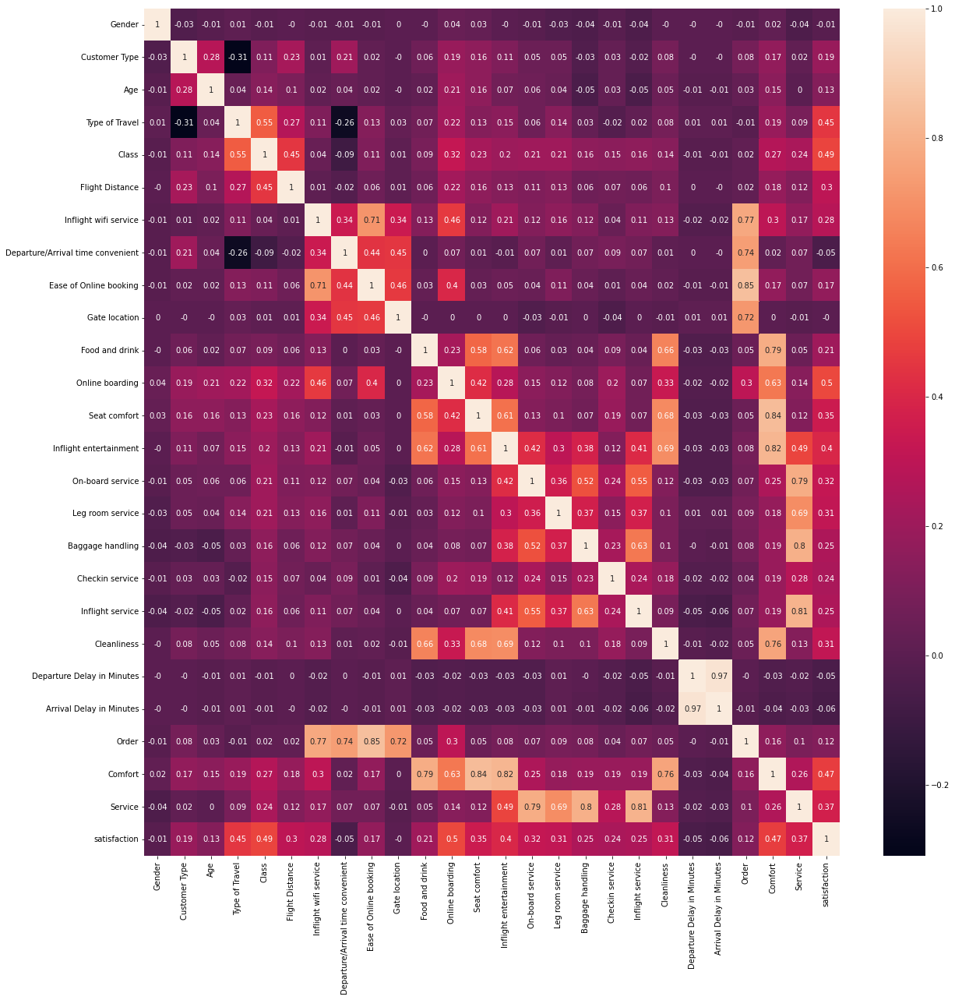

In [ ]:
correlation_matrix = totalData.corr().round(2)
# make the figure larger
_, ax = plt.subplots(figsize=(20,20))
sns.heatmap(data=correlation_matrix, annot=True, ax=ax);

Seat comfort and comfort is highly correlated with each other (0.84). To choose which one to select as a key feature, we look at which one is more correlated with 'Satsifaction'. Since Comfort (0.47) is more correlated to satisfaction rather than Seat Comfort (0.35), we'll **remove Seat Comfort** as a key feature and retain Comfort.

Inflight Wifi Service and Ease of Online Booking is highly correlated with each other (0.71).Since Inflight Wifi Service (0.28) is more correlated to satisfaction rather than Ease of Online Booking (0.17), we'll r**emove Ease of Online Booking** as a key feature and retain Inflight Wifi Service.

* Flight Distance and Class is highly correlated with each other. Class is more correlated with Satisfaction so we'll remove Flight Distance.

* Food and Drink, Inflight Entertainment, Cleanliness is highly correlated to Comfort. Comfort is more correlated to Satisfaction.

* On-board service, Leg room service, Inflight service, Baggage handling is highly correlated to Service. Service is more correlated to Satisfaction.

* Online boarding, although is highly correlated with Comfort, still has a high correlation with satisfaction, So we'll retain both.

* Inflight Wifi Service is highly correlated with Order. Inflight Wifi Service is more correlated to satisfaction than Order.

**Updated Final Key Features**

In [ ]:
selected_features = ['Customer Type', 'Age', 'Type of Travel', 'Class', 'Inflight wifi service', 'Online boarding', 'Checkin service', 'Comfort', 'Service']

The removed features are classified as 'Noise'.

## Task 1b) Select a Metric

Metric chosen: F1 score

Reason:

*   The Confusion/Correlation matrix is only used when there are more than 2 classes. The dataset only has 2 classes (0 - dissatisfied, and 1 - satisfied).
*   The Accuracy is not a suitable metric if the target/labels are not equal because of the 'accuracy paradox'. The dataset has more dissatisfied labels ober the satisfied labels.
*   The F1 score is the perfect balance between precision and recall. The higher the F1 score is, the better.


In [ ]:
print("Train Data:", trainData.shape)
print("Test Data:", testData.shape)
print("Total Data:", totalData.shape)

Train Data: (103594, 26)
Test Data: (25893, 26)
Total Data: (129487, 26)


## Task 1c) Prepare the data sets

The data is currently divided into 80% Training set and 20% Test set.

We will be preparing data using a 3-way split (train/dev/test) method.

We will be splitting the dataset into following segments:
- **Training set - 65%**
- **Validation set - 15%**
- **Test set - 20%**

65% will be allocated to the Training set to train the model.

15% is set for development since we have a large dataset and 15% will be large enough to detect meaningful changes in the accuracy of the model. It is a lot of samples to evaluate the model.

20% is a good amount for the testing data set to test the model on unseen data. 

Dividing the Training set to add a Development set:

In [ ]:
X_train, X_dev, Y_train, Y_dev = train_test_split(trainData[selected_features], trainData['satisfaction'], test_size = 0.15)

Separating the features and the target of the Test set:

In [ ]:
X_test = testData[selected_features]  
Y_test = testData['satisfaction']

**Training set:**
* X_train - Features of Training set, excluding Target
* Y_train - Target column of Training set (Satisfaction)

**Development set:**
* X_dev - Features of Development set, excluding Target
* Y_dev - Target column of Development set (Satisfaction)

**Test set:**
* X_test - Features of Test set, excluding Target
* Y_test - Target column of Test set (Satisfaction)


# Task 2. Train a Logistic Regression Model

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import  plot_confusion_matrix, classification_report, confusion_matrix

Increases the number of iterations (max_iter) to 2000 to achieve convergence of the optimiser.

In [ ]:
model = LogisticRegression()
model.max_iter = 2000

Training the data and testing it on the training set.

In [ ]:
model.fit(X_train, Y_train)

Y_pred_train = model.predict(X_train)

print(classification_report(Y_train, Y_pred_train))

              precision    recall  f1-score   support

           0       0.88      0.90      0.89     49916
           1       0.86      0.83      0.85     38138

    accuracy                           0.87     88054
   macro avg       0.87      0.87      0.87     88054
weighted avg       0.87      0.87      0.87     88054



Testing the model on the dev set.

In [ ]:
Y_pred_dev = model.predict(X_dev)

print(classification_report(Y_dev, Y_pred_dev))

              precision    recall  f1-score   support

           0       0.87      0.90      0.89      8781
           1       0.86      0.83      0.85      6759

    accuracy                           0.87     15540
   macro avg       0.87      0.86      0.87     15540
weighted avg       0.87      0.87      0.87     15540



Testing the model on the test set.

In [ ]:
Y_pred_test = model.predict(X_test)

print(classification_report(Y_test, Y_pred_test))

              precision    recall  f1-score   support

           0       0.87      0.90      0.88     14528
           1       0.86      0.83      0.85     11365

    accuracy                           0.87     25893
   macro avg       0.87      0.86      0.86     25893
weighted avg       0.87      0.87      0.87     25893



Based on the model’s result when tested with the Test set, the model has a high f1 score for predicting if a passenger is dissatisfied or not. Comparing the results with the Training and Development set, the results are very close to each other. This means that the model is neither overfit nor underfit with the training set. 

# Task 3. Train a Decision Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor, export_graphviz
from pydotplus import graph_from_dot_data
import matplotlib.pyplot as plt
from IPython.display import Image
from sklearn.externals.six import StringIO

In [ ]:
def plot_dt_model(model, feature_names, class_names):
    dot_data = export_graphviz(model, 
                            out_file=None, feature_names=feature_names, class_names=class_names,  
                            filled=True, rounded=True, impurity=False, special_characters=True)  
    graph = graph_from_dot_data(dot_data)  
    return Image(graph.create_png())

              precision    recall  f1-score   support

           0       0.95      0.97      0.96     49916
           1       0.96      0.93      0.95     38138

    accuracy                           0.96     88054
   macro avg       0.96      0.95      0.95     88054
weighted avg       0.96      0.96      0.96     88054

              precision    recall  f1-score   support

           0       0.94      0.96      0.95      8781
           1       0.95      0.92      0.93      6759

    accuracy                           0.94     15540
   macro avg       0.94      0.94      0.94     15540
weighted avg       0.94      0.94      0.94     15540

              precision    recall  f1-score   support

           0       0.94      0.96      0.95     14528
           1       0.94      0.92      0.93     11365

    accuracy                           0.94     25893
   macro avg       0.94      0.94      0.94     25893
weighted avg       0.94      0.94      0.94     25893

dot: graph is too l

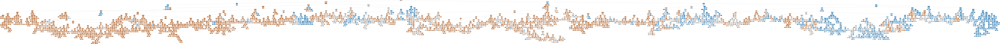

In [ ]:
model = DecisionTreeClassifier(min_samples_leaf=9)
model.fit(X_train,Y_train)
Y_pred_train = model.predict(X_train)
Y_pred_dev = model.predict(X_dev)
Y_pred_test = model.predict(X_test)

print(classification_report(Y_train, Y_pred_train))
print(classification_report(Y_dev, Y_pred_dev))
print(classification_report(Y_test, Y_pred_test))
plot_dt_model(model, selected_features, 'satisfaction')

The results show that the Decision tree does a better job that the Logistical Regression Model based on its higher f1 score. The results between the Training, Development, and Test set are also closely similar to each other, which means that the model is neither overfit nor underfit when tested on unseen data such as the Test set.

# Task 4. Train a Feed-Forward Neural Net

## Sequential Net Architecture

In [ ]:
from tensorflow.keras.datasets import mnist, cifar10
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Conv2D, BatchNormalization, MaxPooling2D, Flatten
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from sklearn.metrics import classification_report

Since the data has been split before into Training and Dev set, we'll use the original Training set (80%) that hasn't been split yet since it will be split into a validation set later on.

In [ ]:
X_train = trainData[selected_features]  
Y_train = trainData['satisfaction']

Verifying that we ahve the original trianing set.

In [ ]:
X_train.shape, Y_train.shape, X_test.shape, Y_test.shape

((103594, 9), (103594,), (25893, 9), (25893,))

In [ ]:
def get_ff_mnist_model():
  model = Sequential()
  # Hidden layer 1
  model.add(Dense(103594, input_shape=(9,)))
  model.add(Activation('relu'))
  # Output layer
  model.add(Dense(1))
  model.add(Activation('sigmoid'))
  return model
model = get_ff_mnist_model()


We've used only Dense layers, ReLu activation functions in the hidden layers, and a singe (1) output unit with the sigmoid activation function in the output layer.

The input_shape is the number of selected features that we have, which is 9. The value 103594 is the Output shape, which is the number of samples of the Training data set. This can be verified with the X.train.shape which was done above.

In [ ]:
# verifying the structure of the model
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_10 (Dense)             (None, 103594)            1035940   
_________________________________________________________________
activation_10 (Activation)   (None, 103594)            0         
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 103595    
_________________________________________________________________
activation_11 (Activation)   (None, 1)                 0         
Total params: 1,139,535
Trainable params: 1,139,535
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

We've used binary_crossentropy as the loss function.

Training the model next:

We'll use a batch_size of 500 to train lots of samples per batch.

In [ ]:
history = model.fit(X_train, Y_train, batch_size=500, epochs=20,  validation_split=0.15, verbose=1)

Epoch 1/20
177/177 [==============================] - 7s 35ms/step - loss: 0.7633 - accuracy: 0.7401 - val_loss: 0.3769 - val_accuracy: 0.8467
Epoch 2/20
177/177 [==============================] - 6s 32ms/step - loss: 0.2980 - accuracy: 0.8860 - val_loss: 0.2534 - val_accuracy: 0.8968
Epoch 3/20
177/177 [==============================] - 6s 32ms/step - loss: 0.2183 - accuracy: 0.9157 - val_loss: 0.1903 - val_accuracy: 0.9268
Epoch 4/20
177/177 [==============================] - 6s 32ms/step - loss: 0.1979 - accuracy: 0.9208 - val_loss: 0.1730 - val_accuracy: 0.9324
Epoch 5/20
177/177 [==============================] - 6s 32ms/step - loss: 0.1850 - accuracy: 0.9250 - val_loss: 0.2186 - val_accuracy: 0.9026
Epoch 6/20
177/177 [==============================] - 6s 32ms/step - loss: 0.1811 - accuracy: 0.9264 - val_loss: 0.1657 - val_accuracy: 0.9342
Epoch 7/20
177/177 [==============================] - 6s 32ms/step - loss: 0.1746 - accuracy: 0.9284 - val_loss: 0.1847 - val_accuracy: 0.9196

This method fit is used to train the model. This would also split the Training set into a 15% dev set, which is used to visualise the error curve.

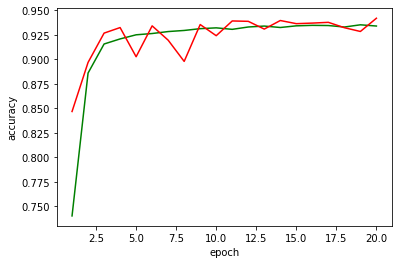

In [ ]:
training_df = pd.DataFrame.from_dict(history.history).assign(epoch=np.array(history.epoch)+1)
sns.lineplot(data=training_df, x='epoch', y='accuracy', color='green');
sns.lineplot(data=training_df, x='epoch', y='val_accuracy', color='red');

As seen on the graph, epoch 7 yields the best validation accuracy. Now we'll re-create the model without the validation split and stop after 7 epochs.

In [ ]:
model = get_ff_mnist_model()
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
model.fit(X_train, Y_train, batch_size=500, epochs=7, verbose=1)

Epoch 1/7
208/208 [==============================] - 7s 30ms/step - loss: 0.6535 - accuracy: 0.7636
Epoch 2/7
208/208 [==============================] - 6s 30ms/step - loss: 0.2561 - accuracy: 0.9025
Epoch 3/7
208/208 [==============================] - 6s 30ms/step - loss: 0.1987 - accuracy: 0.9218
Epoch 4/7
208/208 [==============================] - 6s 30ms/step - loss: 0.1851 - accuracy: 0.9249
Epoch 5/7
208/208 [==============================] - 6s 30ms/step - loss: 0.1726 - accuracy: 0.9298
Epoch 6/7
208/208 [==============================] - 6s 30ms/step - loss: 0.1697 - accuracy: 0.9305
Epoch 7/7
208/208 [==============================] - 6s 30ms/step - loss: 0.1657 - accuracy: 0.9316


Evaluating the model:

In [ ]:
model.evaluate(X_test, Y_test)

810/810 [==============================] - 3s 4ms/step - loss: 0.1628 - accuracy: 0.9333


[0.1627875566482544, 0.9333024621009827]

The accuracy on the test set is 93%, close to the Decision tree's accuracy & which is 94%. It is also close to the validation set's results during training. This means that the model has learned well.

# Task 5. Recommendation


Comparison of Models based on above Analysis:

- Logistic Regression and Decision Tree models, both are neither underfit nor overfit. The models performed well on training data as well as Dev data and Test Data.
- As the dataset was divided into Training set (65%), Validation set (15%) and Test set (20%), each model was tested on the divided segments.
- Logistic Regression had an accuracy of 0.87 on train, dev and test data segments. 
- Decision Tree had the highest accuracy on the train data segment- 0.96. An accuracy of 0.94 on dev and test data segment.
- However, the Decision Tree displayed a higher F1 Score than Logistic Regression.




In summary, the metric score of the models based on the Test data set (unseen data) are as follows:

F1 score
**Logistic Regression**
*   0 - 0.88
*   1 - 0.85
*   87% Accuracy

**Decision Tree Classifier**
*   0 - 0.95
*   1 - 0.94
*   94% Accuracy

**Feed-Forward Neural Network**
*   93% Accuracy

The model we have chosen is the Decision Tree Classifier since it has produced the highest F1 score in predicting the dissatisfied/satisfied passengers. It has also produced the highest accuracy of all models, and at teh same time requires less resources compared to the Feed-forward Neural Network model.